In [1]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import tensorflow as tf
from glob import glob
from yolov3.yolov4_config import Create_Yolo
from yolov3.utils_config import load_yolo_weights, detect_image
from yolov3.configs_config import *
from PIL import Image

import os
import pandas as pd

if YOLO_TYPE == "yolov4":
    Darknet_weights = YOLO_V4_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V4_WEIGHTS
if YOLO_TYPE == "yolov3":
    Darknet_weights = YOLO_V3_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V3_WEIGHTS

yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE)
load_yolo_weights(yolo, Darknet_weights) # use Darknet weights

In [2]:
yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE, CLASSES=TRAIN_CLASSES)
yolo.load_weights("./checkpoints/frist/yolov3_custom") # use keras weights

# image path

In [3]:
tr = glob(r"teeth_including_lip_more\train/*.xml")
te = glob(r"teeth_including_lip_more\test/*.xml")
r5 = glob(r"C:\Users\NA_team_1\Desktop\test\*.jpg")

print("train data : {}".format(len(tr)))
print("validation data : {}".format(len(te)))
print("test data {}".format(len(r5)))

train data : 340
validation data : 85
test data 85


In [4]:
r1 = glob(r"teeth_including_lip_more\test/*.jpg")

In [5]:
r11 = glob(r"teeth_including_lip_more\train/*.jpg")

In [6]:
r2 =  glob(r"anomaly_data/*.jpg")

In [7]:
r3 =  glob(r"crop_anomaly/*.jpg")

In [8]:
r4 =  glob(r"use_image_poster\real_anomaly/*.jpg")

In [9]:
# # in dahun computer 
# coco_anomaly =  glob(r"C:\Users\NA_team2\TensorFlow-2.x-YOLOv3\TensorFlow-2.x-YOLOv3\val2017/*.jpg")

In [10]:
coco_anomaly =  glob(r"C:\Users\NA_team_1\Desktop\val2017\*.jpg")
np.random.seed(42)
a = np.random.randint(5000, size =76)
a = np.sort(a)
print(a)
anomaly_76 = [coco_anomaly[i] for i in a]

[  34  130  161  189  241  337  466  474  600  646  769  775  860  878
  975  995 1016 1021 1076 1082 1184 1267 1275 1363 1478 1500 1528 1585
 1685 1806 1899 1955 1981 2041 2047 2061 2363 2391 2433 2435 2556 2558
 2612 2613 2734 2747 2824 2888 2904 2919 3005 3073 3092 3152 3171 3202
 3342 3385 3444 3461 3556 3772 3798 3843 3890 3943 4014 4117 4297 4426
 4551 4555 4658 4798 4843 4911]


In [11]:
coco_center_crop = glob(r"C:\Users\NA_team_1\Desktop\coco_crop\*.jpg")

In [12]:
# braces =  glob(r"C:\Users\NA_team_1\Desktop\GitHub\TensorFlow-2.x-YOLOv3\braces/*.jpg")

In [13]:
brace_path = r"braces"

In [14]:
angled_path = r"angled"

# train

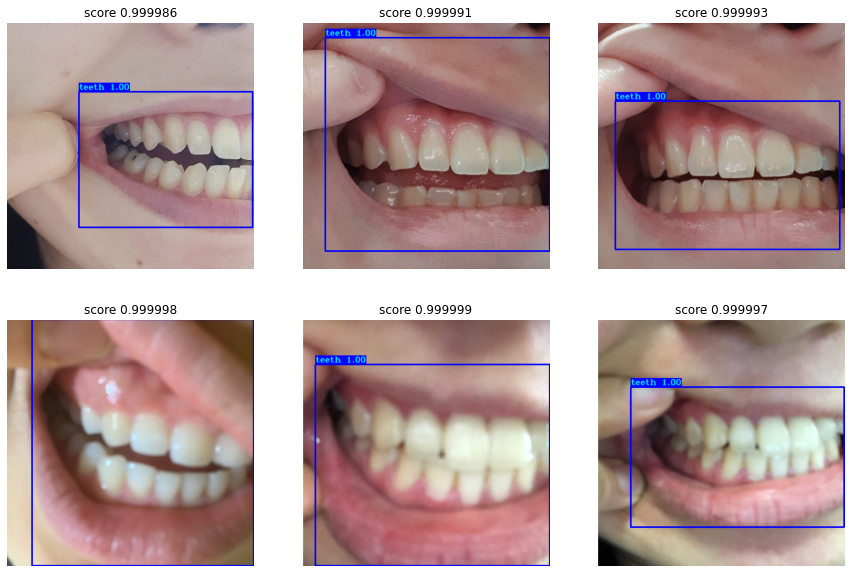

In [15]:
#plt.figure(figsize=(15,30))
#for i in range(18):
#    plt.subplot(6,3,i+1)
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# validation

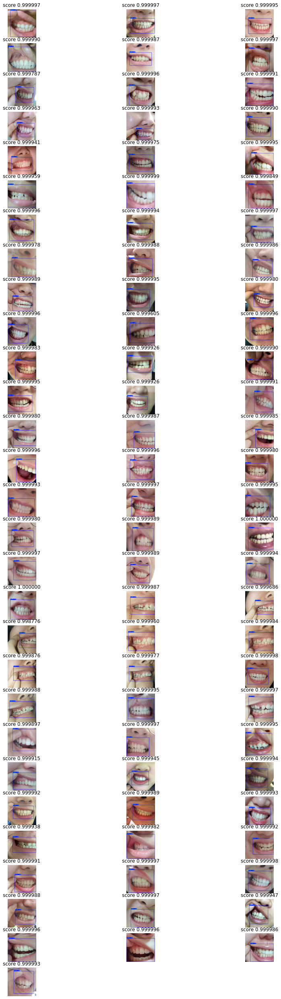

In [16]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

## test

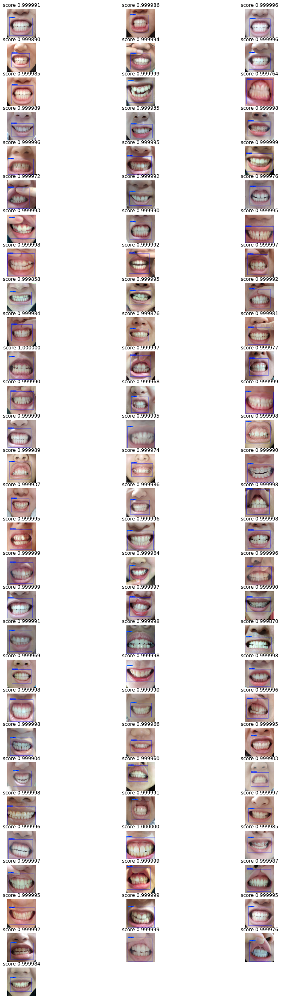

In [17]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# anomaly

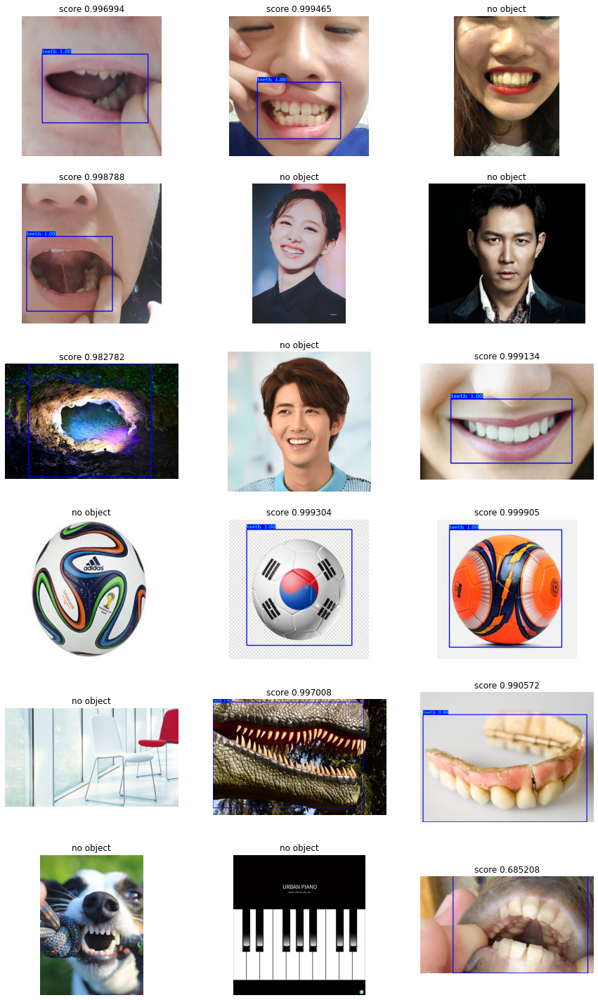

In [18]:
plt.figure(figsize=(15,30))
for i in range(18):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# crop anomaly

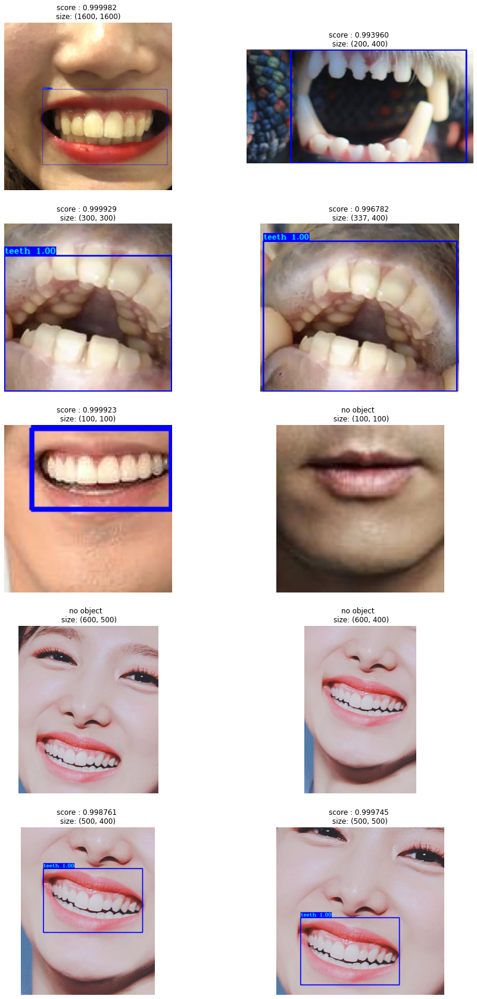

In [19]:
plt.figure(figsize=(15,30))
for i in range(len(r3)):
    plt.subplot(5,2,i+1)
    image, bboxes = detect_image(yolo, r3[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.5 , CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object  \n size: {}'.format(cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
    else :
        plt.title('score : {0:2f} \n size: {1} '.format(bboxes[0][4], cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
plt.show()

# coco 76

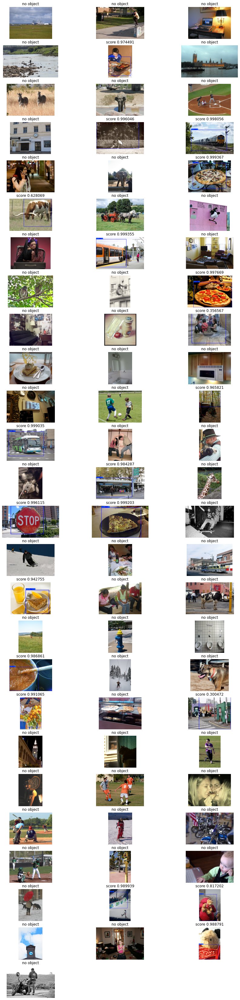

In [20]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, anomaly_76[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# coco 76 center crop

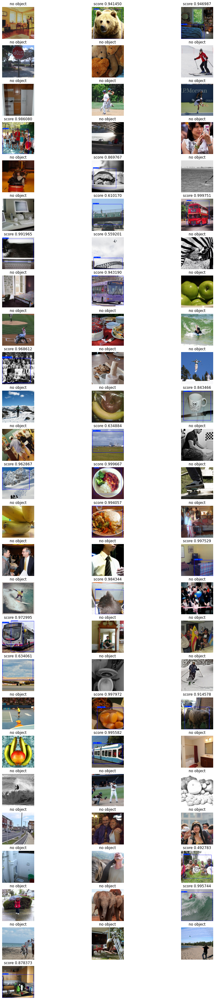

In [21]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# braces

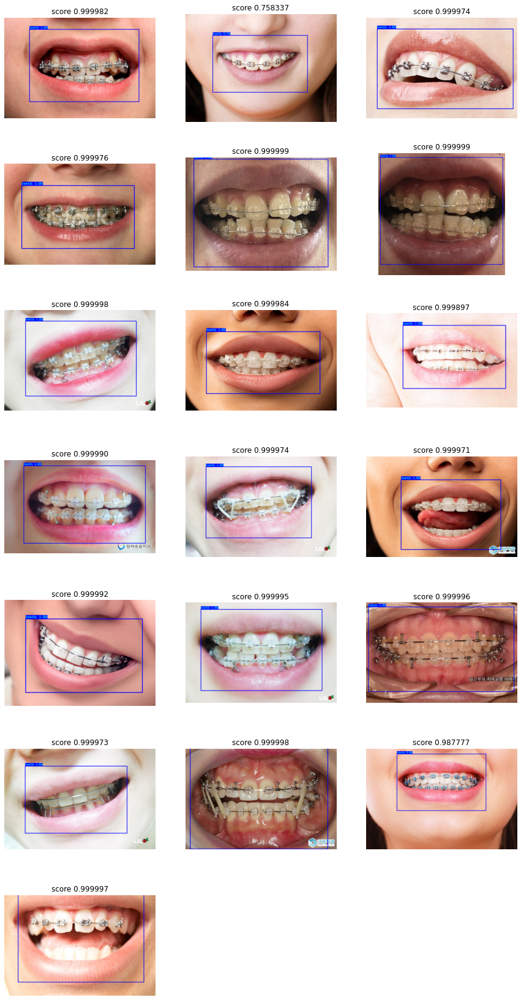

In [22]:
# it contain png files
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(brace_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# angle data

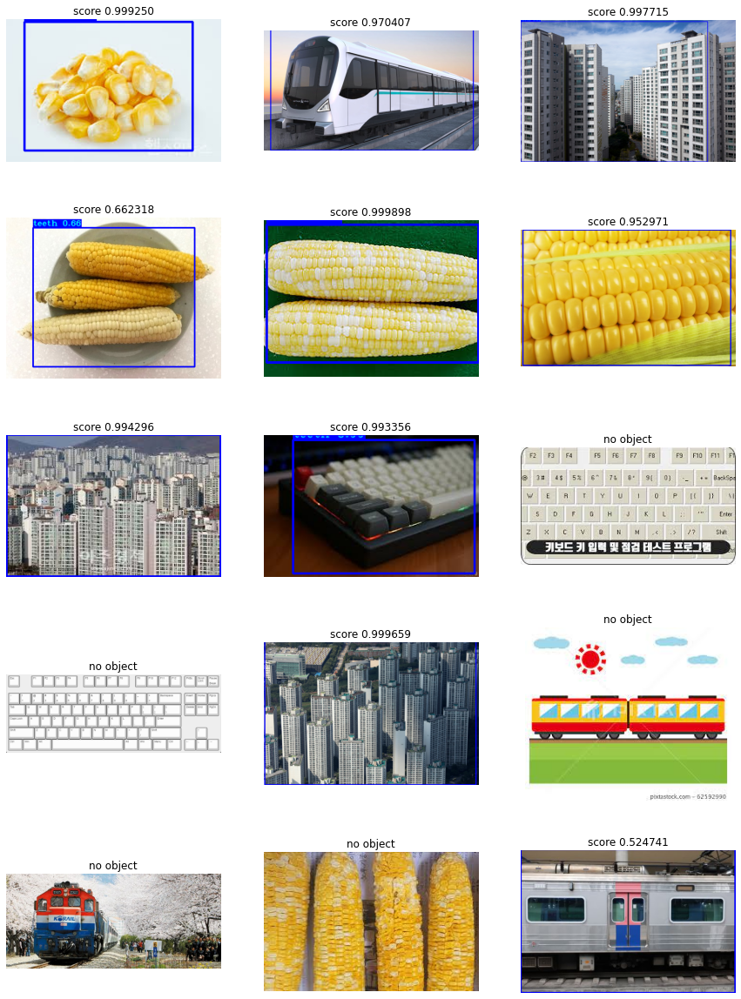

In [23]:
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(angled_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# score evaluate

In [24]:
train_score = [ ]
train_score_i = [ ]
valid_score = []
valid_score_i = []
anomaly_score = []
anomaly_i=[]
center_anomaly_score = []
center_anomaly_i = []

In [25]:
test_score = []
test_score_i = []

In [26]:
braces_score = []
braces_i=[]
angle_score = []
angle_i=[]

In [27]:
full_coco_anomaly_score = []
full_coco_anomaly_i=[]

In [28]:
full_coco_center_anomaly_score = []
full_coco_center_anomaly_i=[]

In [29]:
#train 
for i in range(len(r11)):
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    train_score.append(bboxes[0][4])
    if train_score[i] < 0.85 :
        train_score_i.append(i)
print("training mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(train_score), np.var(train_score), np.min(train_score))  )    

training mean: 0.999989, var : 0.000000, min : 0.999836


In [30]:
#validation
for i in range(len(r1)):
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    valid_score.append(bboxes[0][4])
    if valid_score[i] < 0.85 :
        valid_score_i.append(i)
#     print(i ,bboxes)
print("validation mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(valid_score), np.var(valid_score) , np.min(valid_score)))

validation mean: 0.999957, var : 0.000000, min : 0.998776


In [31]:
#test
for i in range(len(r5)):
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    test_score.append(bboxes[0][4])
    if test_score[i] < 0.85 :
        test_score_i.append(i)
#     print(i ,bboxes)
print("test mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(test_score), np.var(test_score) , np.min(test_score)))

test mean: 0.999980, var : 0.000000, min : 0.999764


In [32]:
#anomaly 85
anomaly_85 = anomaly_76 + r2[-9:]
for i in range(len(anomaly_85)):
    image, bboxes = detect_image(yolo, anomaly_85[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        anomaly_score.append(bboxes[0][4])
        anomaly_i.append(i)

In [33]:
#anomaly 85
print("Wrong 85 anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(anomaly_i[i], anomaly_score[i]))

Wrong 85 anomaly set
coco data : 4, score : 0.974491
coco data : 10, score : 0.996046
coco data : 11, score : 0.998056
coco data : 14, score : 0.999367
coco data : 15, score : 0.628069
coco data : 19, score : 0.999355
coco data : 23, score : 0.997669
coco data : 26, score : 0.356567
coco data : 32, score : 0.965821
coco data : 33, score : 0.999035
coco data : 37, score : 0.984287
coco data : 39, score : 0.996115
coco data : 40, score : 0.999203
coco data : 45, score : 0.942755
coco data : 51, score : 0.986861
coco data : 54, score : 0.991065
coco data : 56, score : 0.300472
coco data : 70, score : 0.989939
coco data : 71, score : 0.817202
coco data : 74, score : 0.988791
coco data : 77, score : 0.999304
coco data : 78, score : 0.999905
coco data : 80, score : 0.997008
coco data : 81, score : 0.990572
coco data : 84, score : 0.685208


In [34]:
#coco anomaly full
for i in range(len(coco_anomaly)):
    image, bboxes = detect_image(yolo, coco_anomaly[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_anomaly_score.append(bboxes[0][4])
        full_coco_anomaly_i.append(i)

over_anomaly_score = [i for i in full_coco_anomaly_score if i>0.8]
over_anomaly_i = []

for i in range(len(full_coco_anomaly_score)):
    if full_coco_anomaly_score[i] in over_anomaly_score :
        over_anomaly_i.append(full_coco_anomaly_i[i])

In [35]:
#coco center anomaly full
for i in range(len(coco_center_crop)):
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_center_anomaly_score.append(bboxes[0][4])
        full_coco_center_anomaly_i.append(i)

over_center_anomaly_score = [i for i in full_coco_center_anomaly_score if i>0.8]
over_center_anomaly_i = []

for i in range(len(full_coco_center_anomaly_score)):
    if full_coco_center_anomaly_score[i] in over_center_anomaly_score :
        over_center_anomaly_i.append(full_coco_center_anomaly_i[i])

In [36]:
#braces 
for i in range(len(os.listdir(brace_path))):
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        braces_score.append(bboxes[0][4])
        braces_i.append(i)
        
under_braces_score = [i for i in braces_score if i<0.85]
under_braces_i= []

for i in range(len(braces_score)):
    if braces_score[i] in under_braces_score :
        under_braces_i.append(braces_i[i])

In [37]:
# angle
for i in range(len(os.listdir(angled_path))):
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        angle_score.append(bboxes[0][4])
        angle_i.append(i)

over_angle_score = [i for i in angle_score if i>0.5]
over_angle_i= []

for i in range(len(angle_score)):
    if angle_score[i] in over_angle_score :
        over_angle_i.append(angle_i[i])

In [38]:
print("Wrong training set")
for i in range(len(train_score_i)):
    print("training data : {0},  score : {1:4f}".format(train_score_i[i], train_score[train_score_i[i]]))

Wrong training set


In [39]:
print("Wrong valid set")
for i in range(len(test_score_i)):
    print("test data : {0}, score : {1:4f}".format(valid_score_i[i], valid_score[valid_score_i[i]]))

Wrong valid set


In [40]:
for i in range(len(full_coco_anomaly_score)):
    print(full_coco_anomaly_score[i])

0.7105175852775574
0.9189726114273071
0.9874258041381836
0.42369523644447327
0.8399895429611206
0.9008585810661316
0.999606192111969
0.570345938205719
0.7628832459449768
0.9832541942596436
0.4899842441082001
0.5451855063438416
0.5048359036445618
0.9998817443847656
0.9999750852584839
0.8452895283699036
0.3315572738647461
0.9975090026855469
0.9871973991394043
0.6875438690185547
0.9979103207588196
0.8717037439346313
0.8913823366165161
0.6442796587944031
0.6883984208106995
0.9374560117721558
0.8598995208740234
0.9985305070877075
0.9968273043632507
0.30768251419067383
0.9903950691223145
0.3895432651042938
0.9960702657699585
0.9970558881759644
0.5743058919906616
0.9823567867279053
0.4169935882091522
0.9168696999549866
0.9999740123748779
0.998095691204071
0.9986209869384766
0.9977095127105713
0.3906727731227875
0.9965082406997681
0.48544570803642273
0.4170585870742798
0.41450992226600647
0.9973690509796143
0.9898765087127686
0.6384685039520264
0.9721972346305847
0.9142932295799255
0.999089241

In [41]:
#full coco
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_anomaly_i[i], over_anomaly_score[i]))

Wrong anomaly set
coco data : 1, score : 0.918973
coco data : 9, score : 0.987426
coco data : 13, score : 0.839990
coco data : 16, score : 0.900859
coco data : 17, score : 0.999606
coco data : 22, score : 0.983254
coco data : 37, score : 0.999882
coco data : 40, score : 0.999975
coco data : 44, score : 0.845290
coco data : 48, score : 0.997509
coco data : 55, score : 0.987197
coco data : 58, score : 0.997910
coco data : 62, score : 0.871704
coco data : 68, score : 0.891382
coco data : 79, score : 0.937456
coco data : 80, score : 0.859900
coco data : 82, score : 0.998531
coco data : 85, score : 0.996827
coco data : 90, score : 0.990395
coco data : 98, score : 0.996070
coco data : 103, score : 0.997056
coco data : 120, score : 0.982357
coco data : 125, score : 0.916870
coco data : 131, score : 0.999974
coco data : 141, score : 0.998096
coco data : 142, score : 0.998621
coco data : 143, score : 0.997710
coco data : 145, score : 0.996508
coco data : 158, score : 0.997369
coco data : 171, s

coco data : 4681, score : 0.996249
coco data : 4691, score : 0.958571
coco data : 4709, score : 0.963444
coco data : 4713, score : 0.999603
coco data : 4716, score : 0.988626
coco data : 4717, score : 0.999232
coco data : 4725, score : 0.986192
coco data : 4728, score : 0.919266
coco data : 4737, score : 0.982980
coco data : 4742, score : 0.988071
coco data : 4752, score : 0.997572
coco data : 4754, score : 0.936192
coco data : 4762, score : 0.967377
coco data : 4766, score : 0.938303
coco data : 4772, score : 0.822604
coco data : 4773, score : 0.948216
coco data : 4780, score : 0.958795
coco data : 4783, score : 0.956210
coco data : 4792, score : 0.958859
coco data : 4803, score : 0.999773
coco data : 4805, score : 0.803340
coco data : 4806, score : 0.832362
coco data : 4817, score : 0.998221
coco data : 4820, score : 0.999971
coco data : 4822, score : 0.990835
coco data : 4839, score : 0.999223
coco data : 4842, score : 0.928995
coco data : 4843, score : 0.988791
coco data : 4848, sc

In [42]:
#full coco_center 
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_center_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_center_anomaly_i[i], over_center_anomaly_score[i]))

Wrong anomaly set
coco data : 1, score : 0.941450
coco data : 2, score : 0.946987
coco data : 9, score : 0.986080
coco data : 13, score : 0.869767
coco data : 17, score : 0.999751
coco data : 18, score : 0.991965
coco data : 22, score : 0.943190
coco data : 27, score : 0.968612
coco data : 32, score : 0.843466
coco data : 36, score : 0.962867
coco data : 37, score : 0.999667
coco data : 40, score : 0.994057
coco data : 44, score : 0.997529
coco data : 46, score : 0.984344
coco data : 48, score : 0.972995
coco data : 55, score : 0.997972
coco data : 56, score : 0.914578
coco data : 58, score : 0.995582
coco data : 71, score : 0.995744
coco data : 75, score : 0.878373
coco data : 77, score : 0.945291
coco data : 79, score : 0.973624
coco data : 80, score : 0.936234
coco data : 82, score : 0.999966
coco data : 85, score : 0.995923
coco data : 98, score : 0.999181
coco data : 101, score : 0.950681
coco data : 103, score : 0.991607
coco data : 131, score : 0.996008
coco data : 141, score : 

coco data : 2461, score : 0.996592
coco data : 2464, score : 0.997925
coco data : 2472, score : 0.976581
coco data : 2476, score : 0.996381
coco data : 2487, score : 0.862361
coco data : 2488, score : 0.997775
coco data : 2498, score : 0.999389
coco data : 2509, score : 0.912458
coco data : 2512, score : 0.998635
coco data : 2513, score : 0.999148
coco data : 2529, score : 0.994284
coco data : 2532, score : 0.984550
coco data : 2548, score : 0.824837
coco data : 2550, score : 0.958035
coco data : 2556, score : 0.999992
coco data : 2567, score : 0.977329
coco data : 2569, score : 0.912214
coco data : 2571, score : 0.999675
coco data : 2575, score : 0.884204
coco data : 2595, score : 0.996142
coco data : 2605, score : 0.941140
coco data : 2624, score : 0.887235
coco data : 2626, score : 0.946627
coco data : 2628, score : 0.978477
coco data : 2630, score : 0.970547
coco data : 2639, score : 0.840610
coco data : 2645, score : 0.992776
coco data : 2648, score : 0.999475
coco data : 2652, sc

In [43]:
# angle
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_angle_i)):
    print("angle data : {0}, score : {1:4f}".format(over_angle_i[i], over_angle_score[i]))

Wrong anomaly set
angle data : 0, score : 0.999250
angle data : 1, score : 0.970407
angle data : 2, score : 0.997715
angle data : 3, score : 0.662318
angle data : 4, score : 0.999898
angle data : 5, score : 0.952971
angle data : 6, score : 0.994296
angle data : 7, score : 0.993356
angle data : 10, score : 0.999659
angle data : 14, score : 0.524741


In [44]:
# brace
print("braces set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

braces set
brace data : 0, score : 0.999982
brace data : 1, score : 0.758337
brace data : 2, score : 0.999974
brace data : 3, score : 0.999976
brace data : 4, score : 0.999999
brace data : 5, score : 0.999999
brace data : 6, score : 0.999998
brace data : 7, score : 0.999984
brace data : 8, score : 0.999897
brace data : 9, score : 0.999990
brace data : 10, score : 0.999974
brace data : 11, score : 0.999971
brace data : 12, score : 0.999992
brace data : 13, score : 0.999995
brace data : 14, score : 0.999996
brace data : 15, score : 0.999973
brace data : 16, score : 0.999998
brace data : 17, score : 0.987777
brace data : 18, score : 0.999997


In [45]:
# brace
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    if braces_score[i]>0.8:
        print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

Wrong anomaly set
brace data : 0, score : 0.999982
brace data : 2, score : 0.999974
brace data : 3, score : 0.999976
brace data : 4, score : 0.999999
brace data : 5, score : 0.999999
brace data : 6, score : 0.999998
brace data : 7, score : 0.999984
brace data : 8, score : 0.999897
brace data : 9, score : 0.999990
brace data : 10, score : 0.999974
brace data : 11, score : 0.999971
brace data : 12, score : 0.999992
brace data : 13, score : 0.999995
brace data : 14, score : 0.999996
brace data : 15, score : 0.999973
brace data : 16, score : 0.999998
brace data : 17, score : 0.987777
brace data : 18, score : 0.999997


# Comparing image

In [46]:
os.mkdir("./image_compare_2")

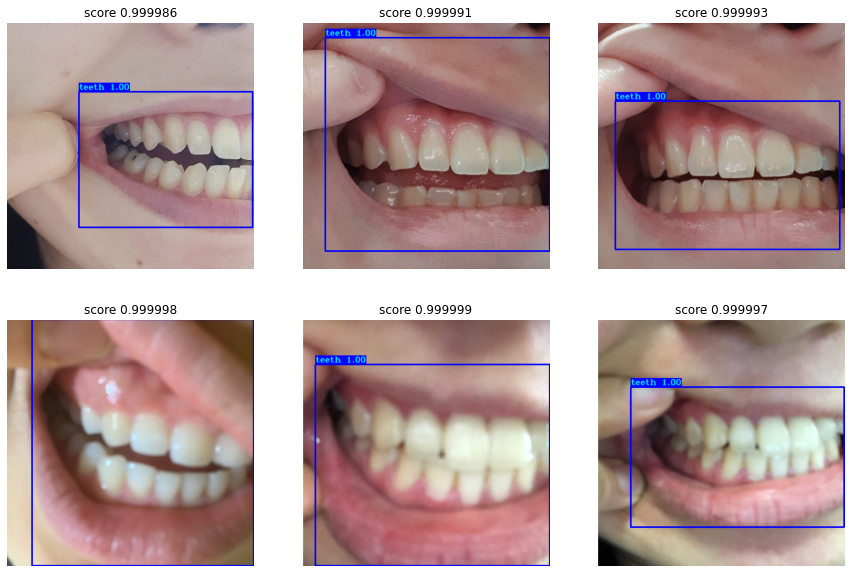

In [47]:
#train good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_good.jpg",bbox_inches = "tight")

In [48]:
#train bad 6 picture
if len(train_score_i)>6 : 
    roof = 6
else: 
    roof = len(train_score_i)
bad_case_train_sort = np.argsort([i for i in train_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[train_score_i[bad_case_train_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

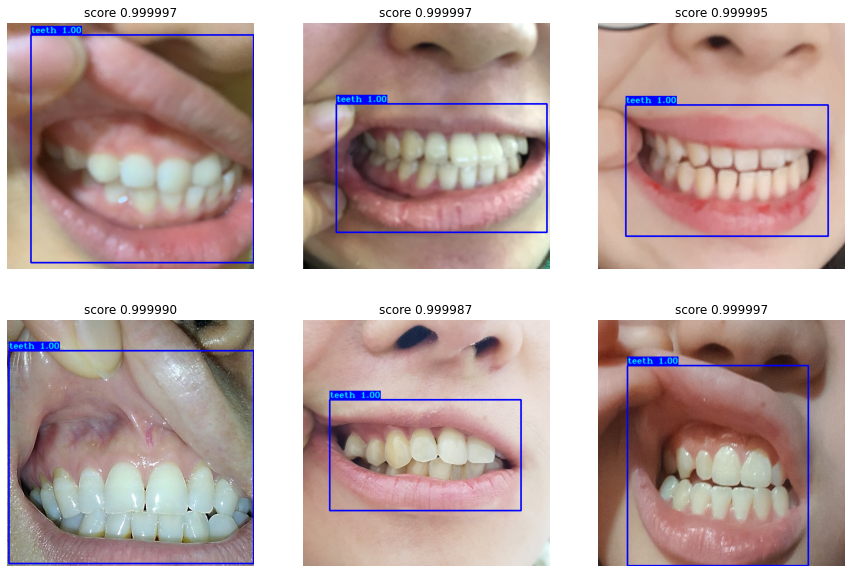

In [49]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_good.jpg",bbox_inches = "tight")

In [50]:
#test bad 6 picture
if len(valid_score_i)>6 : 
    roof = 6
else: 
    roof = len(valid_score_i)
bad_case_valid_sort = np.argsort([i for i in valid_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[valid_score_i[bad_case_valid_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

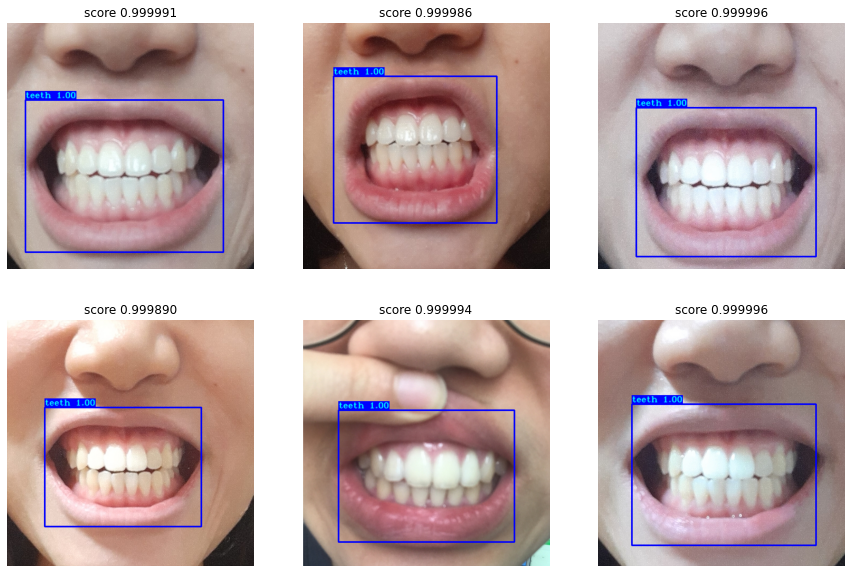

In [51]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_good.jpg",bbox_inches = "tight")

In [52]:
#test bad 6 picture
if len(test_score_i)>6 : 
    roof = 6
else: 
    roof = len(test_score_i)
bad_case_test_sort = np.argsort([i for i in test_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[test_score_i[bad_case_test_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

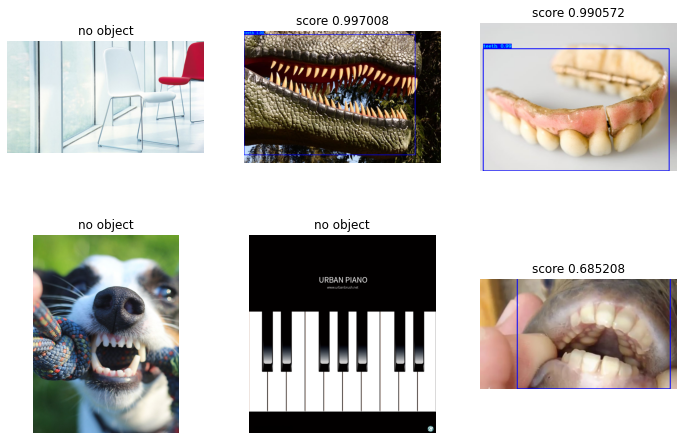

In [53]:
#anomaly
plt.figure(figsize=(12,8))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[-6:][i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/anomaly.jpg",bbox_inches = "tight")

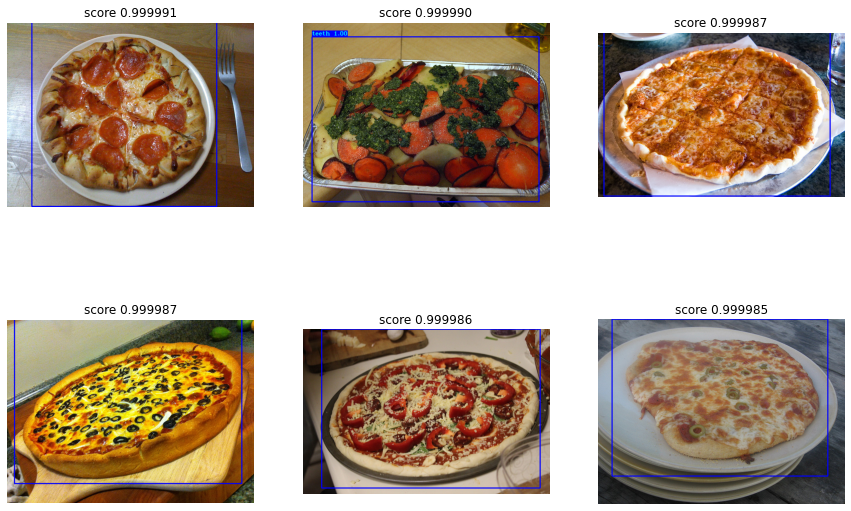

In [54]:
#coco bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_anomaly[over_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/coco_bad.jpg",bbox_inches = "tight")

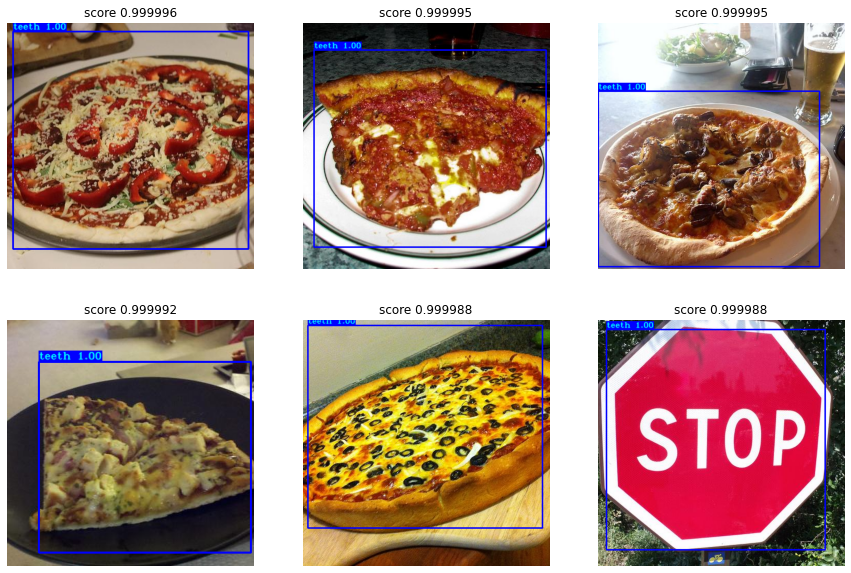

In [55]:
#coco_center bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_center_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[over_center_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/center_coco_bad.jpg",bbox_inches = "tight")

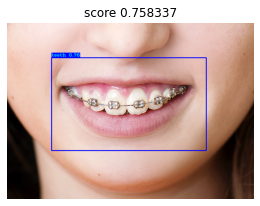

In [56]:
#braces bad 6 picture
bad_case_braces_sort_decent = np.argsort(under_braces_score)
if len(bad_case_braces_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_braces_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[under_braces_i[bad_case_braces_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/braces_bad.jpg",bbox_inches = "tight")

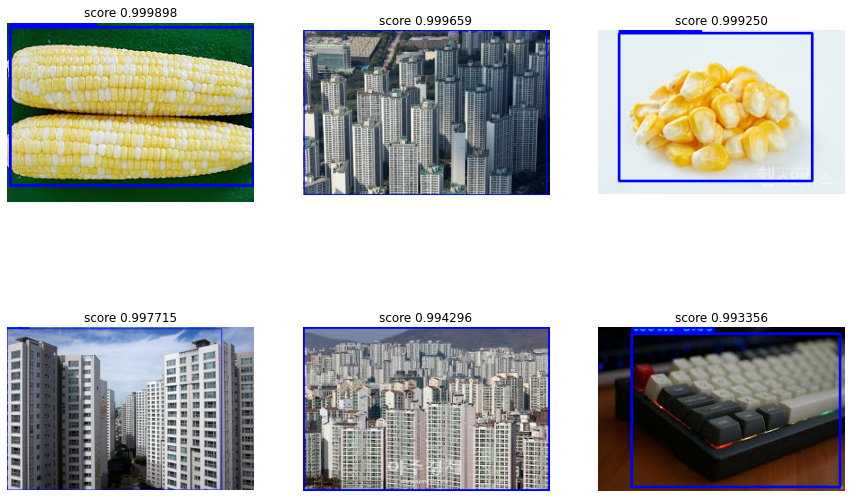

In [57]:
#angle bad 6 picture
bad_case_angle_sort_decent = np.argsort(over_angle_score)[::-1]
if len(bad_case_angle_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_angle_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[over_angle_i[bad_case_angle_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/angle_bad.jpg",bbox_inches = "tight")